# Image Classification
Notebook created by Armand De Asís

Used code of [Santi Pascual](https://github.com/santi-pdp) for the [UPC School](https://www.talent.upc.edu/ing/estudis/formacio/curs/310400/postgrau-artificial-intelligence-deep-learning/) (2019) and updated by [Daniel Fojo](https://www.linkedin.com/in/daniel-fojo/), [Xavier Giro](https://imatge.upc.edu/web/people/xavier-giro), [Pol Caselles](https://www.linkedin.com/in/pcaselles/), [Gerard I. Gállego](https://www.linkedin.com/in/gerard-gallego/) and [Juan José Nieto](https://www.linkedin.com/in/juan-jose-nieto-salas/).

Based on an original version in Keras created by [Miriam Bellver](https://imatge.upc.edu/web/people/miriam-bellver) for the [Barcelona Technology School](https://barcelonatechnologyschool.com/master/master-in-big-data-solutions/) (BTS) in 2018.


We will increase the dataset FashionMNIST using a GAN network, and see if the results in a simple MLP network get better or worse. First we will see results in a simple MLP, then generate new images through GAN and finally retrain MLP with new generated images. 

We load the necessary libraries

In [37]:
import random

import os
import torch
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
from torch.utils.data import ConcatDataset
import torch
from torch import nn, optim

import numpy as np
import matplotlib.pyplot as plt

from typing import Tuple
from torchvision import datasets, transforms, utils
from PIL import Image
from torchvision.transforms import ToPILImage
import math
from IPython.display import display
from tqdm import tqdm
from itertools import cycle
from torchvision.utils import make_grid

To ensure reproducibility of the experiments, we can set the seed to a fixed number.

In [2]:
seed = 123
np.random.seed(seed)
_ = torch.manual_seed(seed)
_ = torch.cuda.manual_seed(seed)

We select CUDA

In [3]:
device = torch.device('cuda')

# MLP model

### Defining the Hyper-parameters

We now define the hyperparameters that are going to be used.


In [48]:
# Let's define some hyper-parameters
hparams1 = {
    'batch_size':64, #changed from 64 to 256
    'num_epochs':10,
    'test_batch_size':64,
    'hidden_size':128,
    'num_classes':10,
    'num_inputs':1024,
    'learning_rate':1e-4,
    'log_interval':100,
}

### Defining the PyTorch Dataset and the DataLoader

We select Fashion MNIST standard dataset

In [49]:
transformation = transforms.Compose([   
    transforms.Resize(32),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])


# Dataset initializations

mnist_trainset = datasets.FashionMNIST(
    root='data',
    train=True,
    download=True,
    transform=transformation)

mnist_testset = datasets.FashionMNIST(
    root='data',
    train=False,
    download=True,
    transform=transformation
)

# Dataloders initialization

train_loader = torch.utils.data.DataLoader(
    dataset=mnist_trainset,
    batch_size=hparams1['batch_size'], 
    shuffle=True,
    drop_last=True,
)

test_loader = torch.utils.data.DataLoader(
    dataset=mnist_testset,
    batch_size=hparams1['test_batch_size'], 
    shuffle=False,
    drop_last=True,
)

In [50]:
# We can retrieve a sample from the dataset by simply indexing it
img, label = mnist_trainset[0]
print('Img shape: ', img.shape)
print('Label: ', label)

# Similarly, we can sample a BATCH from the dataloader by running over its iterator
iter_ = iter(train_loader)
bimg, blabel = next(iter_)
print('Batch Img shape: ', bimg.shape)
print('Batch Label shape: ', blabel.shape)
print(f'The Batched tensors return a collection of {bimg.shape[0]} grayscale images ({bimg.shape[1]} channel, {bimg.shape[2]} height pixels, {bimg.shape[3]} width pixels)')
print(f'In the case of the labels, we obtain {blabel.shape[0]} batched integers, one per image')

Img shape:  torch.Size([1, 32, 32])
Label:  9
Batch Img shape:  torch.Size([64, 1, 32, 32])
Batch Label shape:  torch.Size([64])
The Batched tensors return a collection of 64 grayscale images (1 channel, 32 height pixels, 32 width pixels)
In the case of the labels, we obtain 64 batched integers, one per image


And now let's look at the kind of images we are dealing with:


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


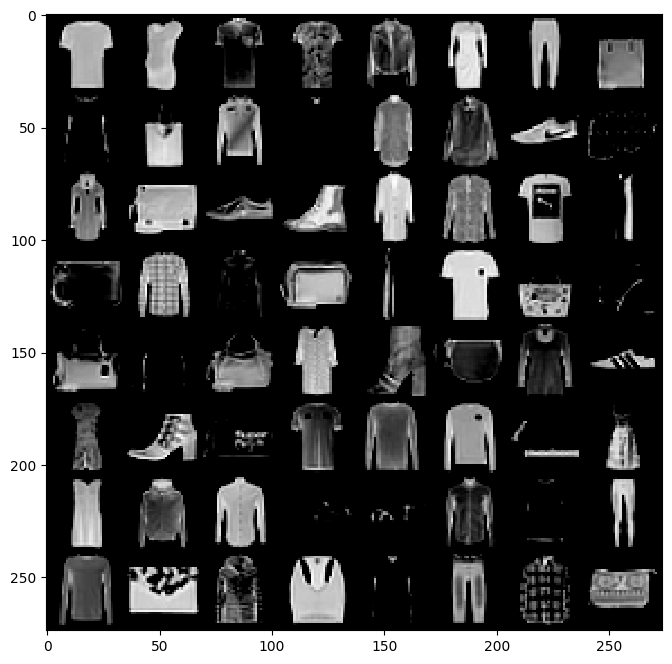

In [51]:
# make_grid is a function from the torchvision package that transforms a batch
# of images to a grid of images
img_grid = make_grid(bimg) 

plt.figure(figsize = (8, 8))
plt.imshow(img_grid.permute(1, 2, 0), interpolation='nearest')

# Training a Multi-Layer Perceptron (MLP)

First we will train our neural network with the training data, loaded from the constructed `train_loader`. The network will then learn to associate images and labels. Finally, we will ask the network to produce predictions for `test_loader` images, and we will verify if these predictions match the labels from `test_loader`.  It consists of a sequence of two `nn.Linear` layers, which are densely-connected (also called "fully-connected") neural layers. The last layer is a 10-way `nn.LogSoftmax`.

In [92]:
network = nn.Sequential(
    nn.Linear(hparams1['num_inputs'], hparams1['hidden_size']),
    nn.ReLU(),
    nn.Linear(hparams1['hidden_size'], hparams1['num_classes']),
    nn.LogSoftmax(dim=1)#calcula probabilitats de la dimensió 1 (no sobre les mostres sino sobre les categories)
)

network.to(device)

Sequential(
  (0): Linear(in_features=1024, out_features=128, bias=True)
  (1): ReLU()
  (2): Linear(in_features=128, out_features=10, bias=True)
  (3): LogSoftmax(dim=1)
)

Now we can check which is the architecture of the network, and the number of parameters of each layer with the following helper function:

In [138]:
def get_nn_nparams(net: torch.nn.Module) -> int:
  """
  Function that returns all parameters regardless of the require_grad value.
  https://discuss.pytorch.org/t/how-do-i-check-the-number-of-parameters-of-a-model/4325/6
  """
  return sum([torch.numel(p) for p in list(net.parameters())])

  
print(network)
print('Num params: ', get_nn_nparams(network))

Sequential(
  (0): Linear(in_features=1024, out_features=128, bias=True)
  (1): ReLU()
  (2): Linear(in_features=128, out_features=10, bias=True)
  (3): LogSoftmax(dim=1)
)
Num params:  132490


In [139]:
bimg = bimg.view (bimg.shape [0], -1) 
bimg.shape

torch.Size([256, 1024])

In [140]:
bimg2 = bimg.view (bimg.shape [0], hparams1['num_inputs']) 
bimg2.shape

torch.Size([256, 1024])

We define a loss function,  an optimizer and metrics to monitor during training and testing.




In [93]:
import torch.nn.functional as F
import torch.optim as optim

criterion = F.nll_loss


# https://pytorch.org/docs/stable/optim.html#torch.optim.RMSprop
# TODO: Create the optimizer
optimizer = optim.RMSprop(network.parameters(), hparams1['learning_rate'])

def compute_accuracy(predicted_batch: torch.Tensor, label_batch: torch.Tensor) -> int:
    """
    Define the Accuracy metric in the function below by:
      (1) obtain the maximum for each predicted element in the batch to get the
        class (it is the maximum index of the num_classes array per batch sample)
        (look at torch.argmax in the PyTorch documentation)
      (2) compare the predicted class index with the index in its corresponding
        neighbor within label_batch
      (3) sum up the number of affirmative comparisons and return the summation

    Parameters:
    -----------
    predicted_batch: torch.Tensor shape: [BATCH_SIZE, N_CLASSES]
        Batch of predictions
    label_batch: torch.Tensor shape: [BATCH_SIZE, 1]
        Batch of labels / ground truths.
    """
    pred = predicted_batch.argmax(dim=1, keepdim=True) # get the index of the max log-probability
    acum = pred.eq(label_batch.view_as(pred)).sum().item()
    return acum


Now, we will define the training and testing functions. In each of them we will iterate over the corresponding data_loader.

Since the input of the network requires a input vector of shape [BATCH_SIZE, H*W], we must rearrange the dimensions of the images. We will use `reshape()` to flatten the 2D images into 1D vectors.

In [94]:
def train_epoch(
        train_loader: torch.utils.data.DataLoader,
        network: torch.nn.Module,
        optimizer: torch.optim,
        criterion: torch.nn.functional,
        log_interval: int,
        ) -> Tuple[float, float]:

    # Activate the train=True flag inside the model
    network.train()

    avg_loss = None
    acc = 0.
    avg_weight = 0.1
    for batch_idx, (data, target) in enumerate(train_loader):

        # Move input data and labels to the device
        data, target = data.to(device), target.to(device)

        # Set network gradients to 0.
        optimizer.zero_grad()

        # TODO: rearrange the data dimension
        data = data.view(data.shape [0], -1) #d'aquesta manera mantenim el drop last i tot el que queda ho poses a una sola dimensió

        # Forward batch of images through the network
        output = network(data)

        # Compute loss
        loss = criterion(output, target)

        # Compute backpropagation
        loss.backward()

        # Update parameters of the network
        optimizer.step()

        # Compute metrics
        acc += compute_accuracy(output, target)
        if avg_loss:
            avg_loss = avg_weight * loss.item() + (1 - avg_weight) * avg_loss
        else:
            avg_loss = loss.item()

        if batch_idx % log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
    avg_acc = 100. * acc / len(train_loader.dataset)

    return avg_loss, avg_acc

In [95]:
@torch.no_grad() # decorator: avoid computing gradients
def test_epoch(
        test_loader: torch.utils.data.DataLoader,
        network: torch.nn.Module,
        ) -> Tuple[float, float]:

    # Dectivate the train=True flag inside the model
    network.eval()
    
    test_loss = 0
    acc = 0
    for data, target in test_loader:
        data, target = data.to(device), target.to(device)

        # TODO
        data = data.view(data.shape [0], -1) #d'aquesta manera mantenim el drop last i tot el que queda ho poses a una sola dimensió.

        output = network(data)

        # Apply the loss criterion and accumulate the loss
        test_loss += criterion(output, target, reduction='sum').item()  # sum up batch loss

        # WARNING: If you are using older Torch versions, the previous call may need to be replaced by
        # test_loss += criterion(output, target, size_average=False).item()

        # compute number of correct predictions in the batch
        acc += compute_accuracy(output, target)

    test_loss /= len(test_loader.dataset)
    # Average accuracy across all correct predictions batches now
    test_acc = 100. * acc / len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, acc, len(test_loader.dataset), test_acc,
        ))
    return test_loss, test_acc

Now that the `network` and the training and test functions are good to go epoch by epoch, build the loop to make as many as `hparams['num_epochs']` epochs by alternating the train and test phases.

In [96]:
# Init lists to save the evolution of the training & test losses/accuracy.
train_losses = []
test_losses = []
train_accs = []
test_accs = []

# For each epoch
for epoch in range(hparams1['num_epochs']):

    # Compute & save the average training loss for the current epoch
    train_loss, train_acc = train_epoch(train_loader, network, optimizer, criterion, hparams1["log_interval"])
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # TODO: Compute & save the average test loss & accuracy for the current epoch
    # HELP: Review the functions previously defined to implement the train/test epochs
    test_loss, test_accuracy = test_epoch(test_loader, network)

    test_losses.append(test_loss)
    test_accs.append(test_accuracy)

Train Epoch: 0 [0/70000 (0%)]	Loss: 2.325046
Train Epoch: 0 [6400/70000 (9%)]	Loss: 0.985553
Train Epoch: 0 [12800/70000 (18%)]	Loss: 0.821203
Train Epoch: 0 [19200/70000 (27%)]	Loss: 0.682679
Train Epoch: 0 [25600/70000 (37%)]	Loss: 0.554872
Train Epoch: 0 [32000/70000 (46%)]	Loss: 0.463854
Train Epoch: 0 [38400/70000 (55%)]	Loss: 0.803865
Train Epoch: 0 [44800/70000 (64%)]	Loss: 0.767888
Train Epoch: 0 [51200/70000 (73%)]	Loss: 0.777397
Train Epoch: 0 [57600/70000 (82%)]	Loss: 0.722929
Train Epoch: 0 [64000/70000 (91%)]	Loss: 0.689542

Test set: Average loss: 0.5256, Accuracy: 8087/10000 (81%)

Train Epoch: 1 [0/70000 (0%)]	Loss: 0.675123
Train Epoch: 1 [6400/70000 (9%)]	Loss: 0.365924
Train Epoch: 1 [12800/70000 (18%)]	Loss: 0.540520


KeyboardInterrupt: 

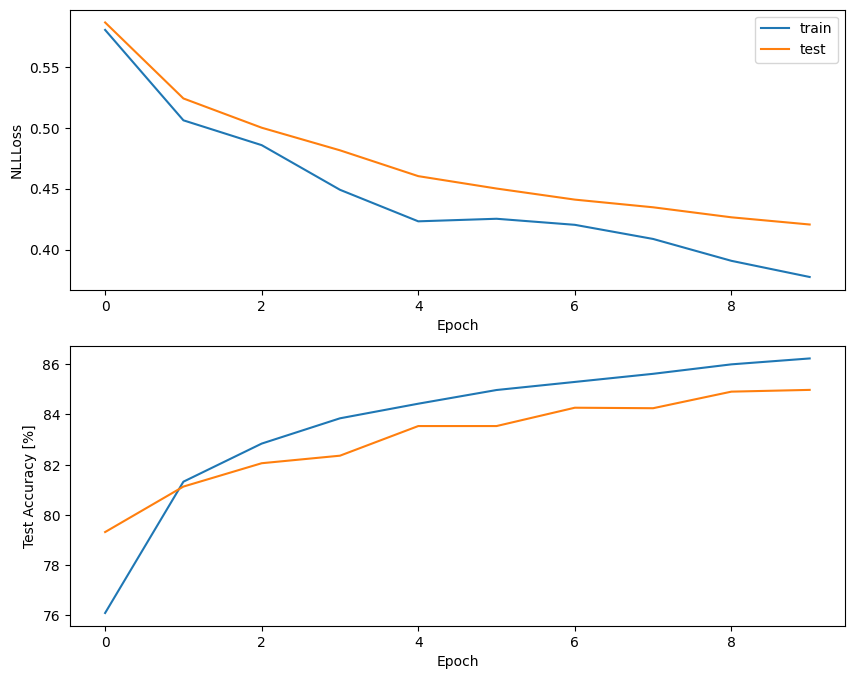

In [145]:
# Plot the plots of the learning curves
plt.figure(figsize=(10, 8))
plt.subplot(2,1,1)
plt.xlabel('Epoch')
plt.ylabel('NLLLoss')
plt.plot(train_losses, label='train')
plt.plot(test_losses, label='test')
plt.legend()
plt.subplot(2,1,2)
plt.xlabel('Epoch')
plt.ylabel('Test Accuracy [%]')
plt.plot(train_accs, label='train')
plt.plot(test_accs, label='test')

We get around 85% of accuracy

## Make more images using Conditional GAN network

**Defining the Hyper-parameters**

We now define the hyperparameters that are going to be used for the GAN.

In [76]:
hparams2 = {
    'batch_size':128,
    'num_epochs':20,
    'learning_rate':0.0003,
    'betas':(0.5, 0.999),
    'noise_size':100,
    'num_val_samples':25,
    'num_save_samples':1000,
    'num_classes':10,
    'num_input_channels':1,
}

### Dataset and Data Loader
Download and prepare dataset and dataloader

In [77]:
train_transforms = transforms.Compose([   
    transforms.Resize(32),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

dataset = datasets.FashionMNIST(
    root='data',
    train=True,
    download=True,
    transform=train_transforms,
)

dataloader = torch.utils.data.DataLoader(
    dataset, 
    batch_size=hparams2['batch_size'], 
    shuffle=True,
)

In [78]:
class ConditionalGenerator(torch.nn.Module):
    
    def __init__(
            self, 
            noise_size: int,
            num_input_channels: int,
            num_classes: int
            ) -> None:
        
        super().__init__()
      
        # TODO: Create the Fully connected layer using nn.Linear
        self.fc = nn.Linear(noise_size, 512*4*4)

        # Embedding of the class
        self.embedding = nn.Embedding(
            num_embeddings=num_classes, 
            embedding_dim=4*4,
        )

        # TODO: Create the first block
        self.convt1 = nn.Sequential(
            nn.ConvTranspose2d(in_channels = 512+1, out_channels = 256, kernel_size=(4,4), stride = 2, padding = 1, bias=False), # (B, 256, 8, 8)
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )

        # TODO: Create the second block
        self.convt2 = nn.Sequential(
            nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size=(4,4), stride = 2, padding = 1, bias=False), # (B, 128, 16, 16)
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )

        # TODO: Create the third block using nn.Sequential with ConvTranspose2d, and activation
        self.convt3 = nn.Sequential(
            nn.ConvTranspose2d(in_channels = 128, out_channels = num_input_channels, kernel_size=(4,4), stride = 2, padding = 1, bias=False), # (B, num_input_channels, 32, 32)
            nn.Tanh(),
        )

    def forward(self, x: torch.Tensor, label: int) -> torch.Tensor:
        
        # TODO: Define the forward of the generator, x are random noise vectors (B, noise_size)
        x = self.fc(x)
        x = x.reshape(-1,512,4,4) # (B, channels, height, width)
        emb = self.embedding(label).reshape(-1, 1, 4, 4) # (B, 1, height, width)
        x = torch.cat((x, emb), dim=1)
        
        x = self.convt1(x)
        x = self.convt2(x)
        x = self.convt3(x)
        
        return x

Know we define the discriminator

In [79]:
class ConditionalDiscriminator(torch.nn.Module):
    
    def __init__(self, 
                 num_input_channels: int,
                 num_classes: int):
        super().__init__()

        self.embedding = nn.Embedding(
            num_embeddings=num_classes, 
            embedding_dim=32*32,
        )
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels = num_input_channels+1, out_channels = 128, kernel_size=(4,4), stride = 2, padding = 3, bias=False), # (B, 128, 16, 16)
            nn.LeakyReLU(0.2),
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size=(4,4), stride = 2, padding = 1, bias=False), # (B, 256, 8, 8)
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels = 256, out_channels = 512, kernel_size=(4,4), stride = 2, padding = 1, bias=False), # (B, 512, 4, 4)
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
        )
        self.fc = nn.Sequential(
            nn.Linear(512*4*4,1),
            nn.Sigmoid(), # Binary classification (real vs false)
        )

    def forward(self, x: torch.Tensor, label: int) -> torch.Tensor:
        emb = self.embedding(label).reshape(-1, 1, 32, 32) # (B, 1, height, width)
        x = torch.cat((x, emb), dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        bsz, nch, height, width = x.shape
        x = x.reshape(bsz,nch*height*width) #fem un flatten de la sortida de les convolucions
        x = self.fc(x)
        return x
    

In [80]:
generator = ConditionalGenerator(hparams2['noise_size'], hparams2['num_input_channels'], 
                                 hparams2['num_classes']).to(device)
optimizer_g = torch.optim.Adam(generator.parameters(), lr=hparams2['learning_rate'], 
                               betas=hparams2['betas'])

discriminator = ConditionalDiscriminator(hparams2['num_input_channels'],hparams2['num_classes']).to(device)
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=hparams2['learning_rate'], betas=hparams2['betas'])

criterion = nn.BCELoss()

def init_weights(m):
    if type(m) in {nn.Conv2d, nn.ConvTranspose2d, nn.Linear}:
        torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)
        if m.bias != None:
            torch.nn.init.constant_(m.bias, 0.0)
    if type(m) == nn.BatchNorm2d:
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.constant_(m.bias, 0)

generator.apply(init_weights)
discriminator.apply(init_weights);

## Train function

In [81]:
def train_batch_conditional(
        real_samples: torch.Tensor, 
        real_classes: torch.Tensor,
        generator: torch.nn.Module,
        discriminator: torch.nn.Module,
        optimizer_g: torch.optim,
        optimizer_d: torch.optim,
        ) -> Tuple[float, float]:

    generator.train()
    discriminator.train()

    bsz = real_samples.shape[0]

    # TODO: Define the labels for the real (ones) and fake (zeros) images of size (bsz, 1)
    label_real = torch.ones(bsz,1)
    label_fake = torch.zeros(bsz,1)

    label_real = label_real.to(device)
    label_fake = label_fake.to(device)

    ####################
    # OPTIMIZE GENERATOR
    ####################

    # Reset gradients
    optimizer_g.zero_grad() 

    # Generate fake samples
    z = torch.randn(bsz, hparams2['noise_size'], device=device) 
    fake_classes = torch.randint(0, 10, size=(bsz, 1), device=device)
    fake_samples = generator(z, fake_classes) 
    
    # Evaluate the generated samples with the discriminator
    predictions_g_fake = discriminator(fake_samples, fake_classes) 

    # Calculate error with respect to what the generator wants
    loss_g = criterion(predictions_g_fake, label_real) 

    # Backpropagate
    loss_g.backward() 
    
    # Update weights
    optimizer_g.step() 

    ########################
    # OPTIMIZE DISCRIMINATOR
    ########################

    fake_samples = fake_samples.detach()
    
    # Reset gradients
    optimizer_d.zero_grad() 

    # Calculate discriminator prediction for real samples
    predictions_d_real = discriminator(real_samples, real_classes) 

    # Calculate error with respect to what the discriminator wants
    loss_d_real = criterion(predictions_d_real, label_real) 

    # Calculate discriminator loss for fake samples
    predictions_d_fake = discriminator(fake_samples, fake_classes) 

    # Calculate error with respect to what the discriminator wants
    loss_d_fake = criterion(predictions_d_fake, label_fake) 
    
    # Total discriminator loss
    loss_d = (loss_d_real + loss_d_fake) / 2

    # Backpropagate
    loss_d.backward() 

    # Update weights
    optimizer_d.step() 

    return loss_g.item(), loss_d.item()


## Evaluation function

In [82]:
@torch.no_grad()
def evaluate_conditional(
        generator: torch.nn.Module,
        z_val: torch.Tensor,
        labels_val: torch.Tensor,
        ) -> Image.Image:
    
    generator.eval()
    fake_samples = generator(z_val, labels_val).cpu()
    # select a sample or create grid if img is a batch
    nrows = int(math.sqrt(fake_samples.shape[0]))
    img = utils.make_grid(fake_samples, nrow=nrows)

    # unnormalize
    img = (img*0.5 + 0.5)*255

    # to numpy
    image_numpy = img.numpy().astype(np.uint8)
    image_numpy = np.transpose(image_numpy, (1, 2, 0))
    return Image.fromarray(image_numpy)

## Save function

In [83]:
@torch.no_grad()
def evaluate_store_conditional(
        generator: torch.nn.Module,
        z_val: torch.Tensor,
        labels_val: torch.Tensor,
        label: int,
        ) -> Image.Image:

    # Create output directory if it doesn't exist
    output_dir = os.getcwd()
    os.makedirs(output_dir+"/gen_data/"+str(label), exist_ok=True)
    output_dir = output_dir+"/gen_data/"+str(label)
    
    generator.eval()
    fake_samples = generator(z_val, labels_val).cpu()
    for i in range(len(fake_samples)):
        image = fake_samples[i].squeeze().cpu()  # Remove channel dimension and move to CPU
        image = (image*0.5 + 0.5)*255
        image = ToPILImage()(image)  # Convert to PIL Image
        image_path = os.path.join(output_dir, f'image_{i}.png')
        image.save(image_path)
    # select a sample or create grid if img is a batch
    nrows = int(math.sqrt(fake_samples.shape[0]))
    img = utils.make_grid(fake_samples, nrow=nrows)

    # unnormalize
    img = (img*0.5 + 0.5)*255

    # to numpy
    image_numpy = img.numpy().astype(np.uint8)
    image_numpy = np.transpose(image_numpy, (1, 2, 0))
    return Image.fromarray(image_numpy)

## Train loop


Epoch: 1/20, batch: 200/469, G_loss: 4.852602481842041, D_loss: 0.024488750845193863


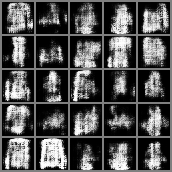


Epoch: 1/20, batch: 400/469, G_loss: 4.301793098449707, D_loss: 0.12978985905647278


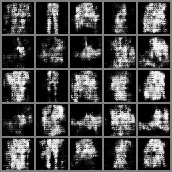


Epoch: 1/20, batch: 469/469, G_loss: 2.4465255737304688, D_loss: 0.1370542198419571


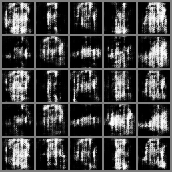


Epoch: 2/20, batch: 200/469, G_loss: 0.42745471000671387, D_loss: 0.8432473540306091


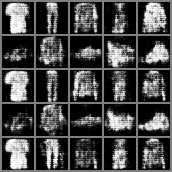


Epoch: 2/20, batch: 400/469, G_loss: 2.4168128967285156, D_loss: 0.30800557136535645


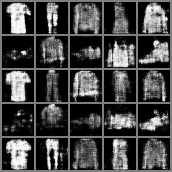


Epoch: 2/20, batch: 469/469, G_loss: 2.5325675010681152, D_loss: 0.3772995173931122


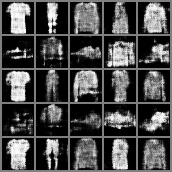


Epoch: 3/20, batch: 200/469, G_loss: 0.5784430503845215, D_loss: 0.8211097717285156


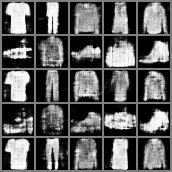


Epoch: 3/20, batch: 400/469, G_loss: 2.5921788215637207, D_loss: 0.4562828540802002


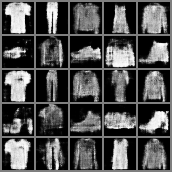


Epoch: 3/20, batch: 469/469, G_loss: 1.5313386917114258, D_loss: 0.48327863216400146


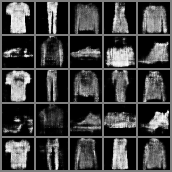


Epoch: 4/20, batch: 200/469, G_loss: 1.1913902759552002, D_loss: 0.43203359842300415


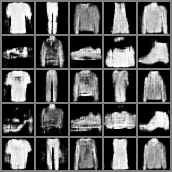


Epoch: 4/20, batch: 400/469, G_loss: 0.7522937059402466, D_loss: 0.4812217950820923


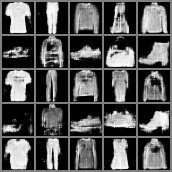


Epoch: 4/20, batch: 469/469, G_loss: 1.5929179191589355, D_loss: 0.3896269202232361


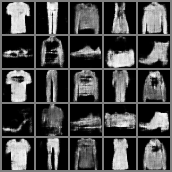


Epoch: 5/20, batch: 200/469, G_loss: 1.8877875804901123, D_loss: 0.2740098237991333


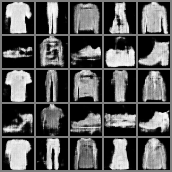


Epoch: 5/20, batch: 400/469, G_loss: 2.5241293907165527, D_loss: 0.23502123355865479


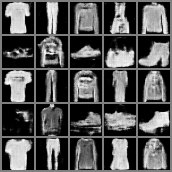


Epoch: 5/20, batch: 469/469, G_loss: 0.6203117370605469, D_loss: 0.571022629737854


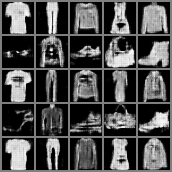


Epoch: 6/20, batch: 200/469, G_loss: 2.8816795349121094, D_loss: 0.2571713924407959


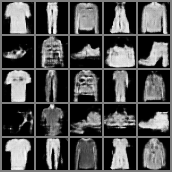


Epoch: 6/20, batch: 400/469, G_loss: 1.54512619972229, D_loss: 0.21644532680511475


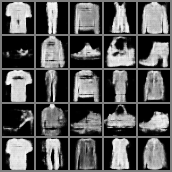


Epoch: 6/20, batch: 469/469, G_loss: 2.491943836212158, D_loss: 0.22188317775726318


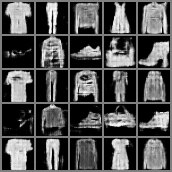


Epoch: 7/20, batch: 200/469, G_loss: 1.3188064098358154, D_loss: 0.3061569929122925


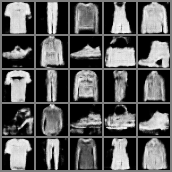


Epoch: 7/20, batch: 400/469, G_loss: 5.312228202819824, D_loss: 0.934270977973938


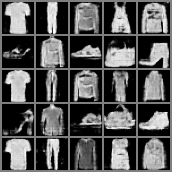


Epoch: 7/20, batch: 469/469, G_loss: 2.7503323554992676, D_loss: 0.06710529327392578


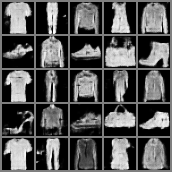


Epoch: 8/20, batch: 200/469, G_loss: 1.290808916091919, D_loss: 0.3193262815475464


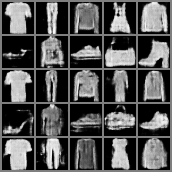


Epoch: 8/20, batch: 400/469, G_loss: 3.4383506774902344, D_loss: 0.03977518528699875


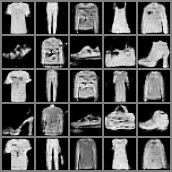


Epoch: 8/20, batch: 469/469, G_loss: 3.407754421234131, D_loss: 0.031926240772008896


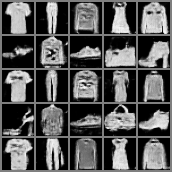


Epoch: 9/20, batch: 200/469, G_loss: 4.422436237335205, D_loss: 0.03190877288579941


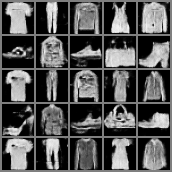


Epoch: 9/20, batch: 400/469, G_loss: 5.734121322631836, D_loss: 0.7304162383079529


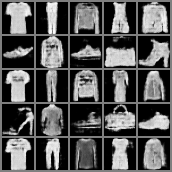


Epoch: 9/20, batch: 469/469, G_loss: 3.9319541454315186, D_loss: 0.02747855894267559


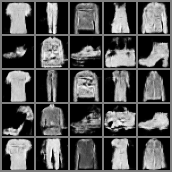


Epoch: 10/20, batch: 200/469, G_loss: 4.555615425109863, D_loss: 0.02246851846575737


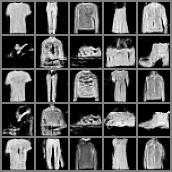


Epoch: 10/20, batch: 400/469, G_loss: 4.028735637664795, D_loss: 0.17249131202697754


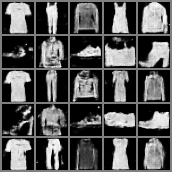


Epoch: 10/20, batch: 469/469, G_loss: 4.014423370361328, D_loss: 0.05367395281791687


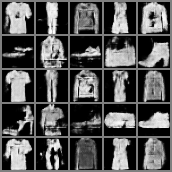


Epoch: 11/20, batch: 200/469, G_loss: 4.800370693206787, D_loss: 0.08464549481868744


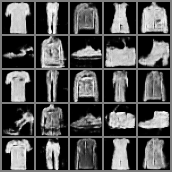


Epoch: 11/20, batch: 400/469, G_loss: 3.8185315132141113, D_loss: 0.02827957272529602


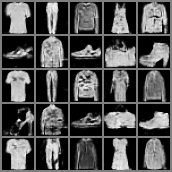


Epoch: 11/20, batch: 469/469, G_loss: 4.252896308898926, D_loss: 0.026230568066239357


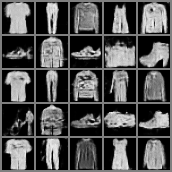


Epoch: 12/20, batch: 200/469, G_loss: 1.9198627471923828, D_loss: 0.17742590606212616


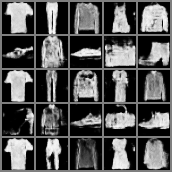


Epoch: 12/20, batch: 400/469, G_loss: 2.5343315601348877, D_loss: 0.09109644591808319


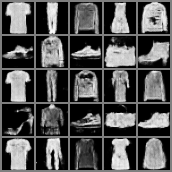


Epoch: 12/20, batch: 469/469, G_loss: 4.749720573425293, D_loss: 0.016614893451333046


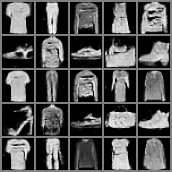


Epoch: 13/20, batch: 200/469, G_loss: 0.7153289318084717, D_loss: 0.8401097655296326


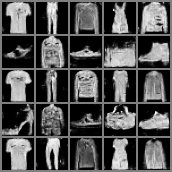


Epoch: 13/20, batch: 400/469, G_loss: 4.676303863525391, D_loss: 0.018340442329645157


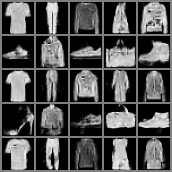


Epoch: 13/20, batch: 469/469, G_loss: 3.6696431636810303, D_loss: 0.10962334275245667


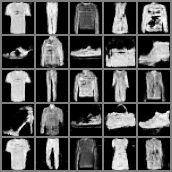


Epoch: 14/20, batch: 200/469, G_loss: 1.8547444343566895, D_loss: 0.17094403505325317


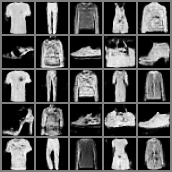


Epoch: 14/20, batch: 400/469, G_loss: 5.829061031341553, D_loss: 0.007203289307653904


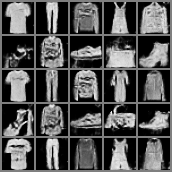


Epoch: 14/20, batch: 469/469, G_loss: 2.988891363143921, D_loss: 0.12254191935062408


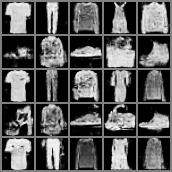


Epoch: 15/20, batch: 200/469, G_loss: 3.8030264377593994, D_loss: 0.11123427003622055


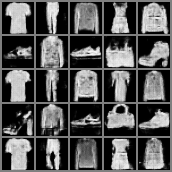


Epoch: 15/20, batch: 400/469, G_loss: 4.314661979675293, D_loss: 0.03709786385297775


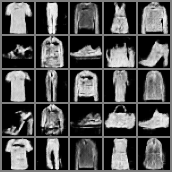


Epoch: 15/20, batch: 469/469, G_loss: 5.3005170822143555, D_loss: 0.019818538799881935


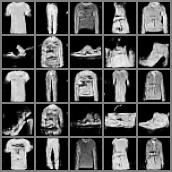


Epoch: 16/20, batch: 200/469, G_loss: 4.330768585205078, D_loss: 0.01969149522483349


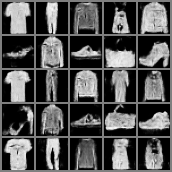


Epoch: 16/20, batch: 400/469, G_loss: 3.262934684753418, D_loss: 0.05906296148896217


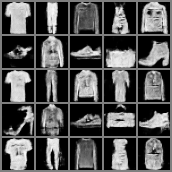


Epoch: 16/20, batch: 469/469, G_loss: 3.9245879650115967, D_loss: 0.03374749422073364


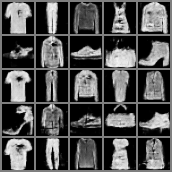


Epoch: 17/20, batch: 200/469, G_loss: 4.695098876953125, D_loss: 0.020445754751563072


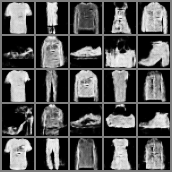


Epoch: 17/20, batch: 400/469, G_loss: 2.2761125564575195, D_loss: 0.13354000449180603


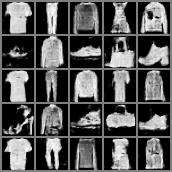


Epoch: 17/20, batch: 469/469, G_loss: 3.222445011138916, D_loss: 0.18037018179893494


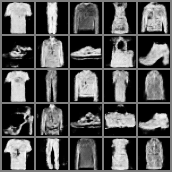


Epoch: 18/20, batch: 200/469, G_loss: 3.180251121520996, D_loss: 0.06209774315357208


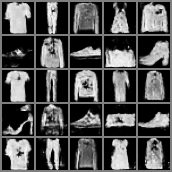


Epoch: 18/20, batch: 400/469, G_loss: 2.939056634902954, D_loss: 0.08000671863555908


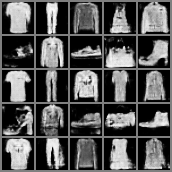


Epoch: 18/20, batch: 469/469, G_loss: 4.9266228675842285, D_loss: 0.012542301788926125


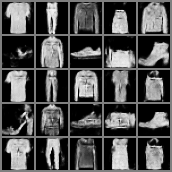


Epoch: 19/20, batch: 200/469, G_loss: 4.608260154724121, D_loss: 0.01184452697634697


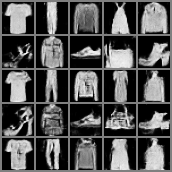


Epoch: 19/20, batch: 400/469, G_loss: 4.7877888679504395, D_loss: 0.01963665895164013


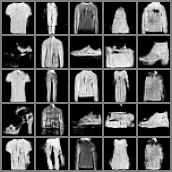


Epoch: 19/20, batch: 469/469, G_loss: 4.411372661590576, D_loss: 0.015331774950027466


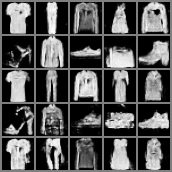


Epoch: 20/20, batch: 200/469, G_loss: 2.8655474185943604, D_loss: 0.0980391651391983


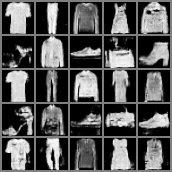


Epoch: 20/20, batch: 400/469, G_loss: 3.7961068153381348, D_loss: 0.10742712020874023


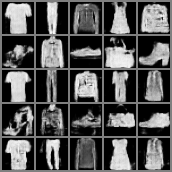


Epoch: 20/20, batch: 469/469, G_loss: 3.407561779022217, D_loss: 0.06787966936826706


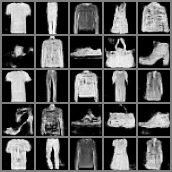

In [84]:
z_val = torch.randn(hparams2['num_val_samples'], hparams2['noise_size'], device=device)
labels_cycle = cycle(range(hparams2['num_classes']))
labels_val = torch.tensor([next(labels_cycle) for i in range(hparams2['num_val_samples'])],
                          device=device).unsqueeze(1) #the labels will be a cycle from 0 to 9

for epoch in range(hparams2['num_epochs']):

    for i, (real_samples, real_classes) in enumerate(dataloader):
        real_samples = real_samples.to(device)
        real_classes = real_classes.unsqueeze(1).to(device)
        loss_g, loss_d = train_batch_conditional(
            real_samples, 
            real_classes, 
            generator, 
            discriminator, 
            optimizer_g, 
            optimizer_d,
        )

        if (i+1) % 200 == 0:
            print(f"\nEpoch: {epoch+1}/{hparams2['num_epochs']}, batch: {i+1}/{len(dataloader)},"
                  + f" G_loss: {loss_g}, D_loss: {loss_d}")
            
            fake_images = evaluate_conditional(generator, z_val, labels_val)
            display(fake_images)

    print(f"\nEpoch: {epoch+1}/{hparams2['num_epochs']}, batch: {i+1}/{len(dataloader)}, "
          + f"G_loss: {loss_g}, D_loss: {loss_d}")
    
    fake_images = evaluate_conditional(generator, z_val, labels_val)
    display(fake_images)

### Conditional generation

Now we can create more images

Number chosen:  0


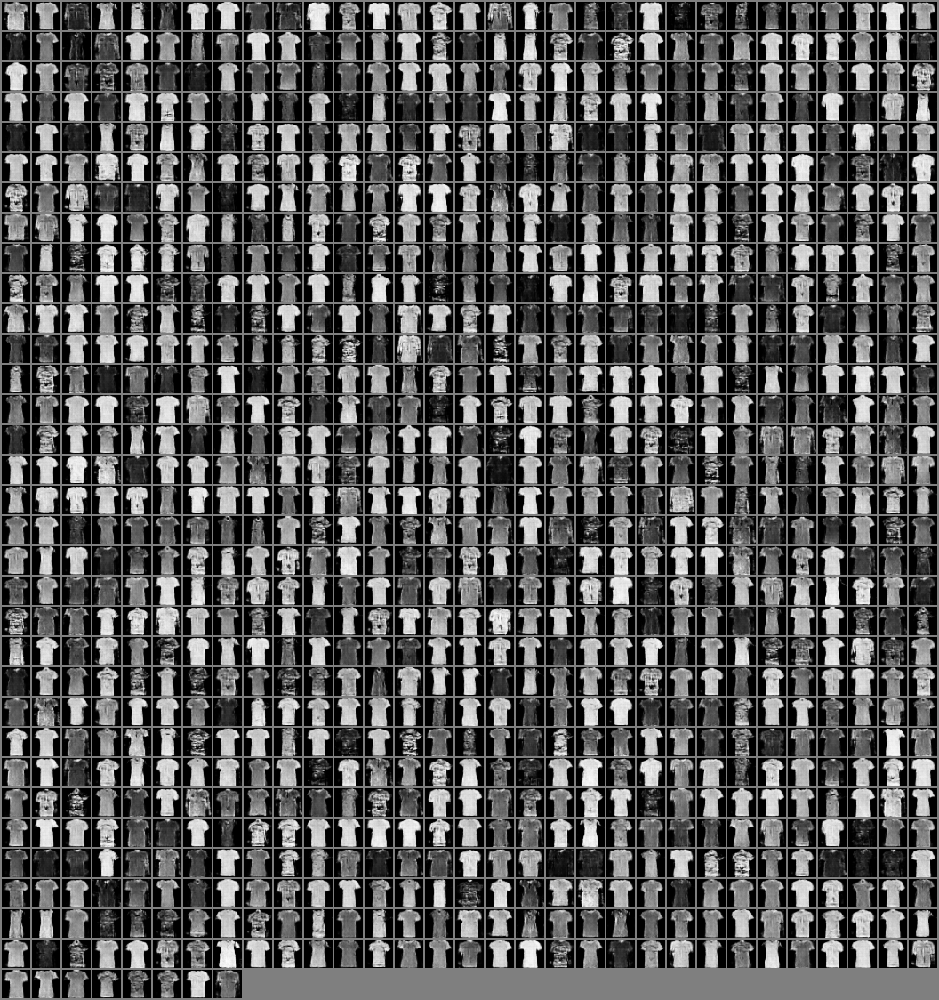

Number chosen:  1


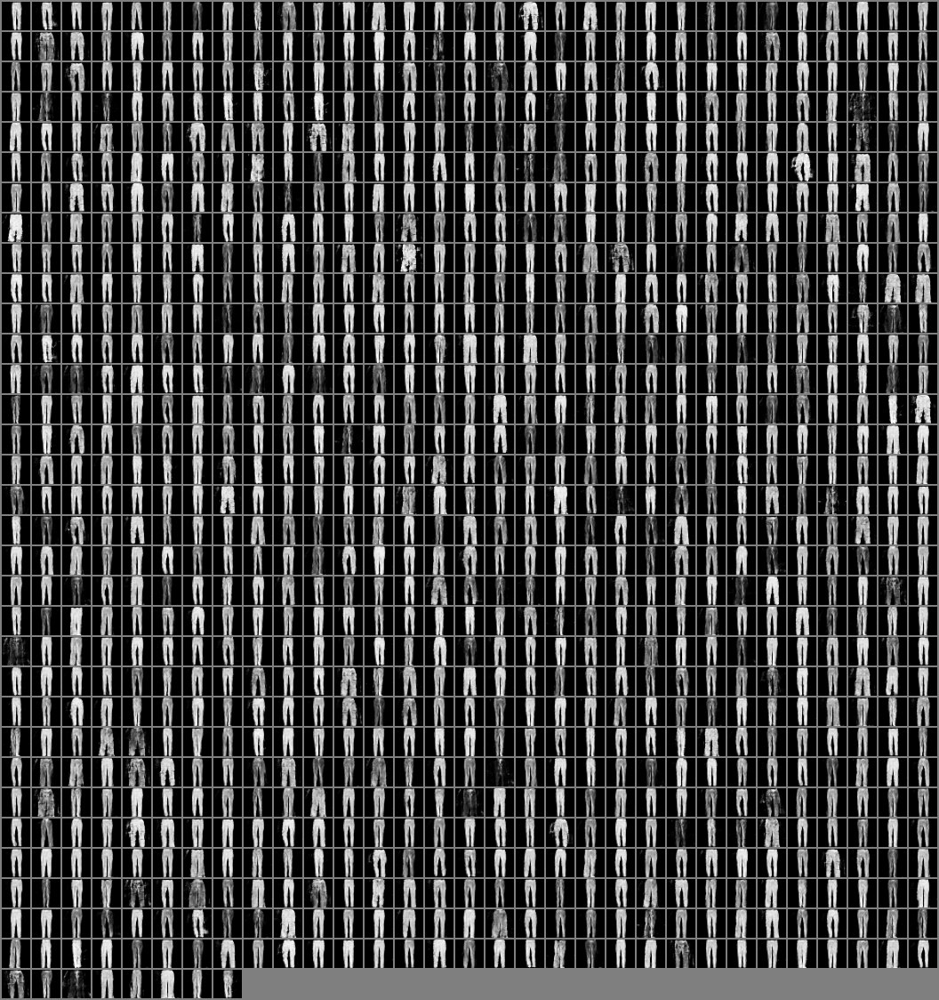

Number chosen:  2


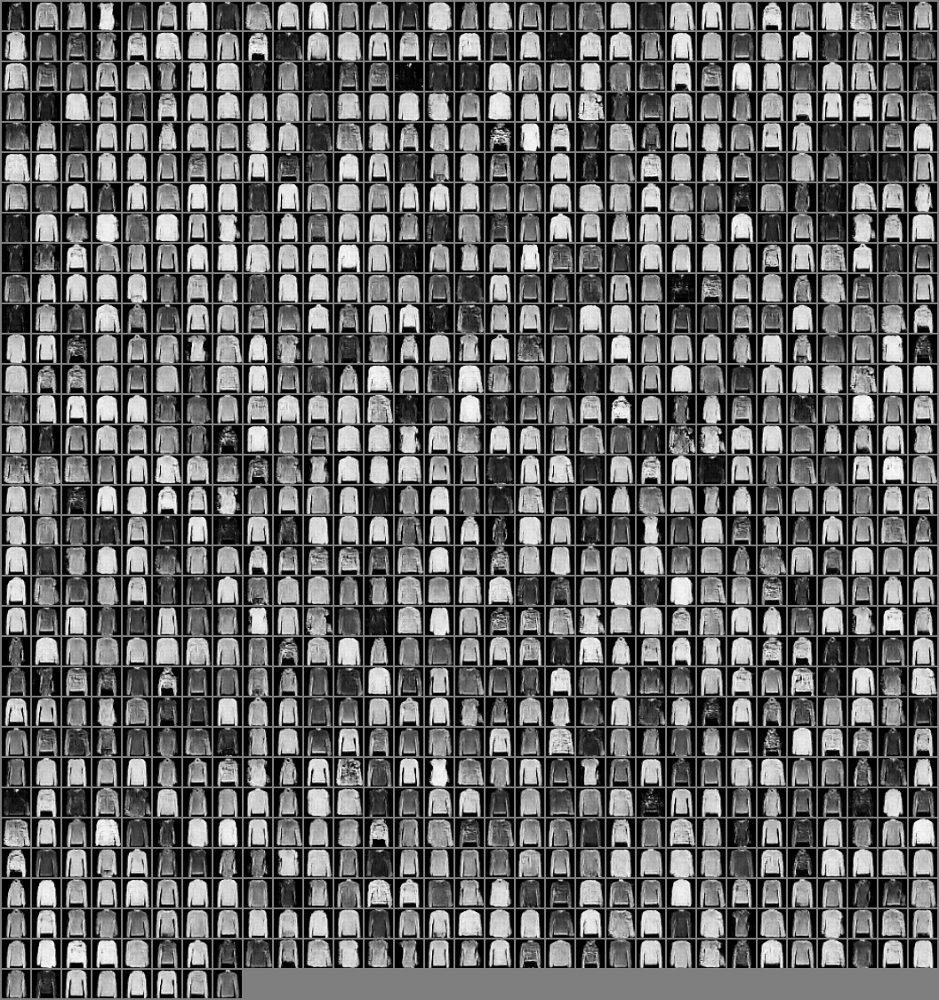

Number chosen:  3


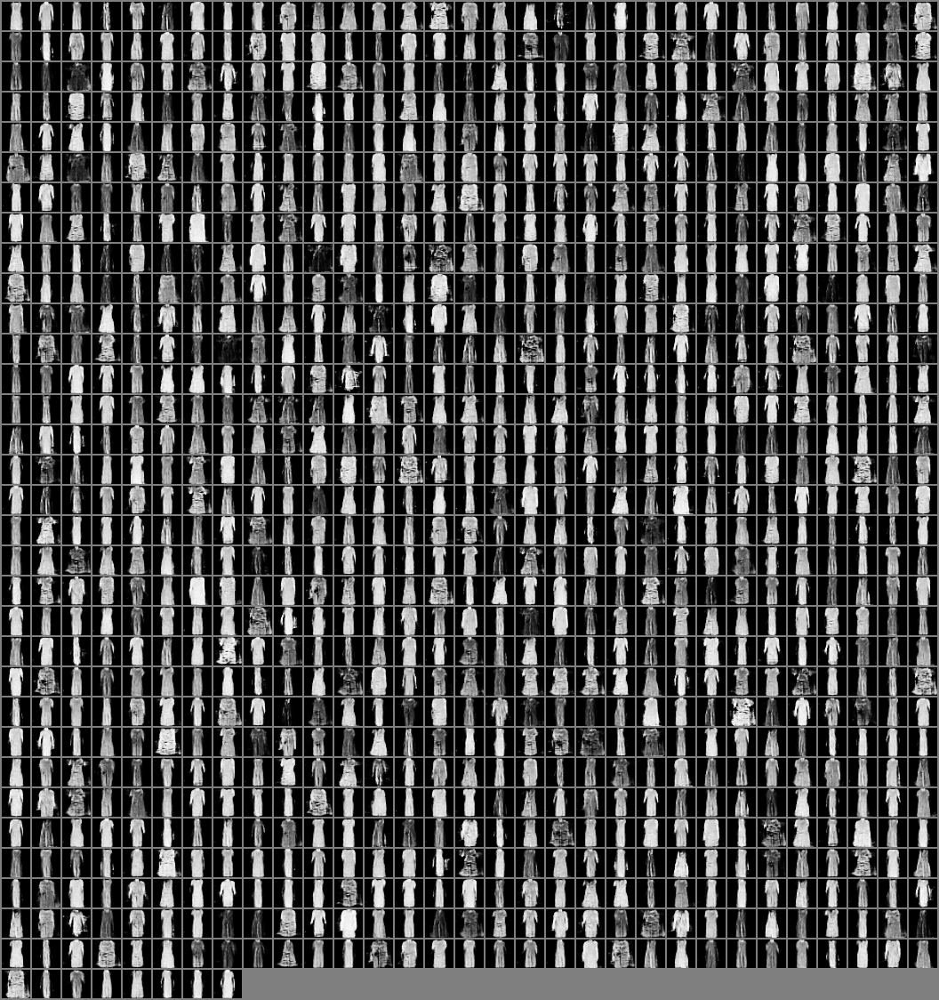

Number chosen:  4


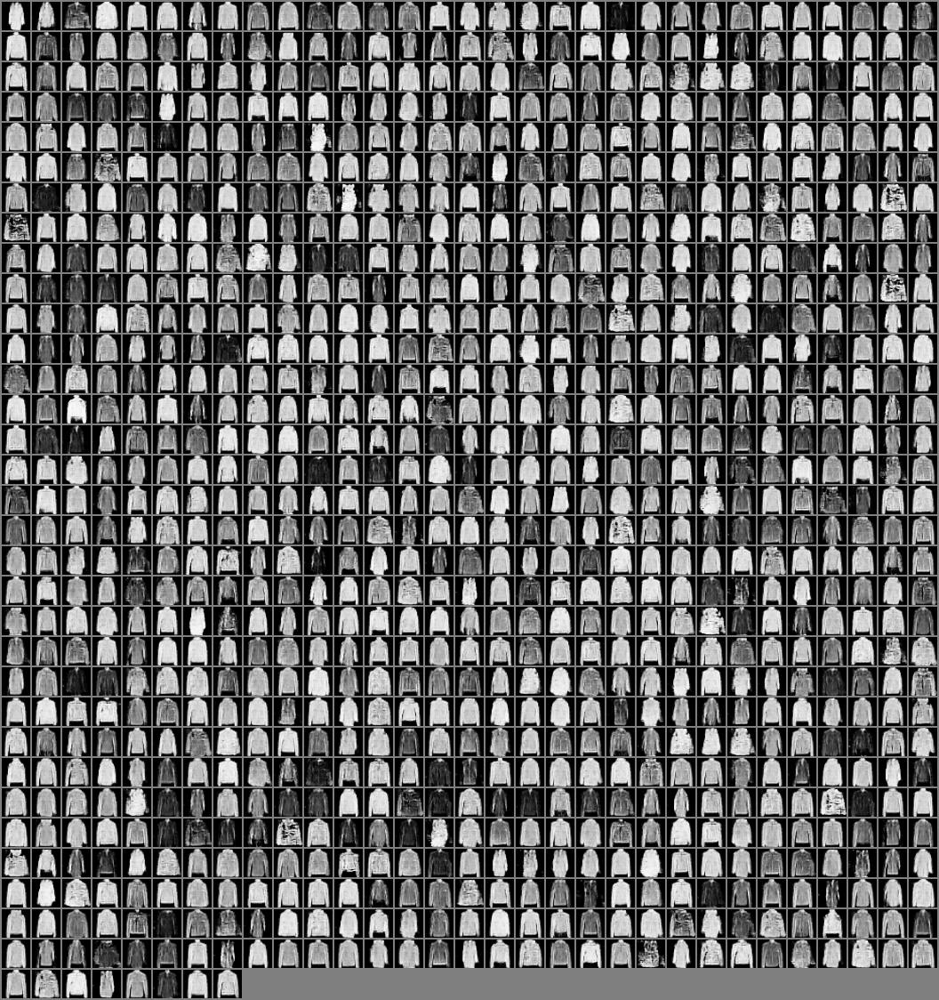

Number chosen:  5


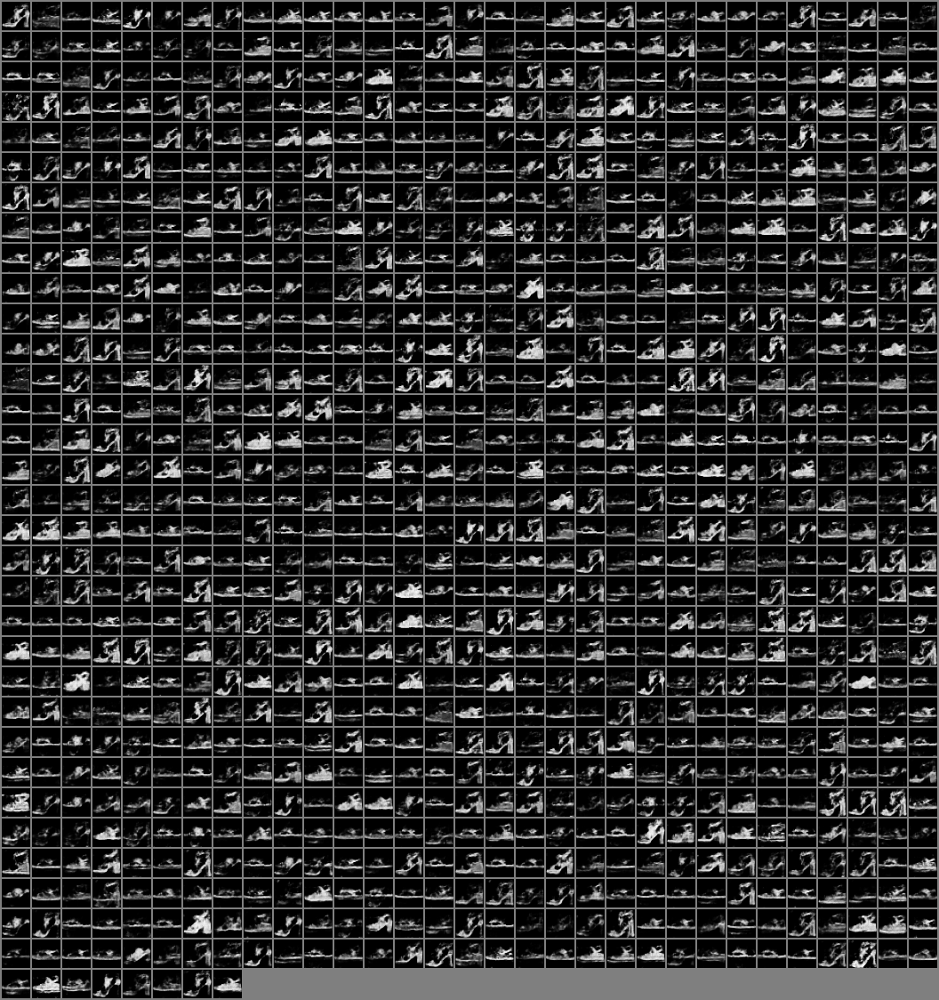

Number chosen:  6


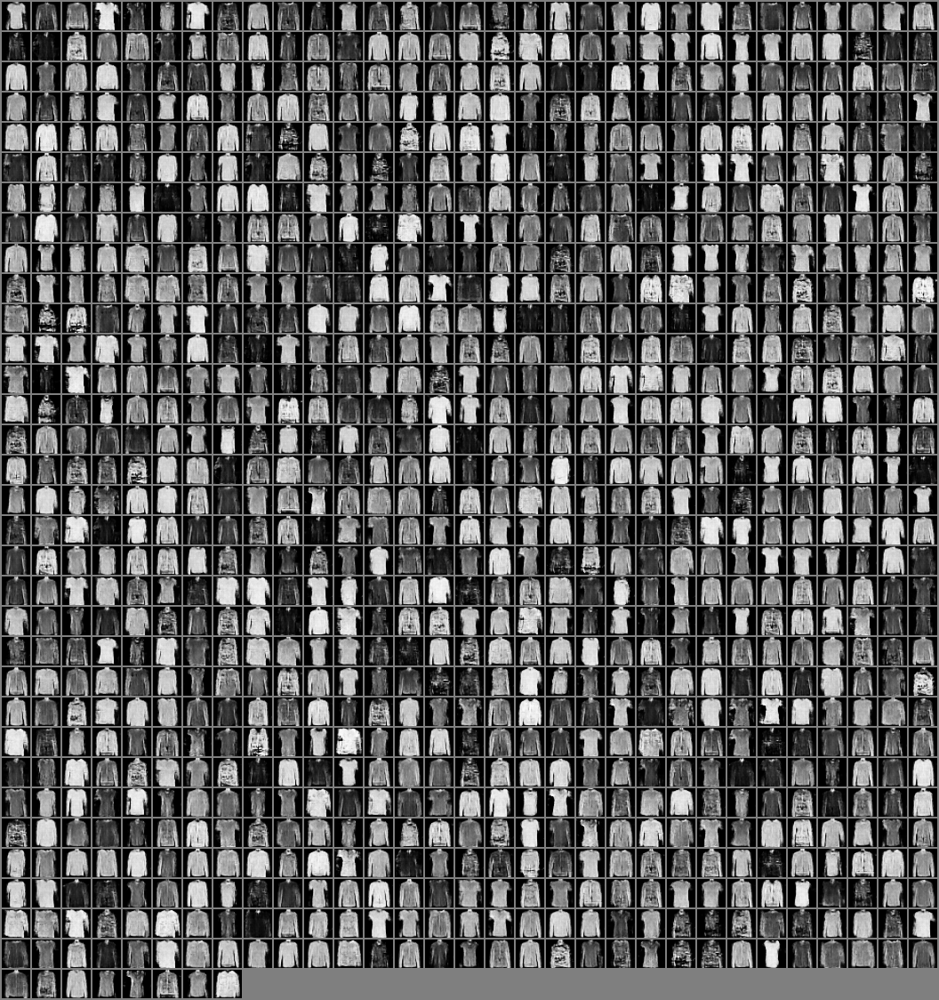

Number chosen:  7


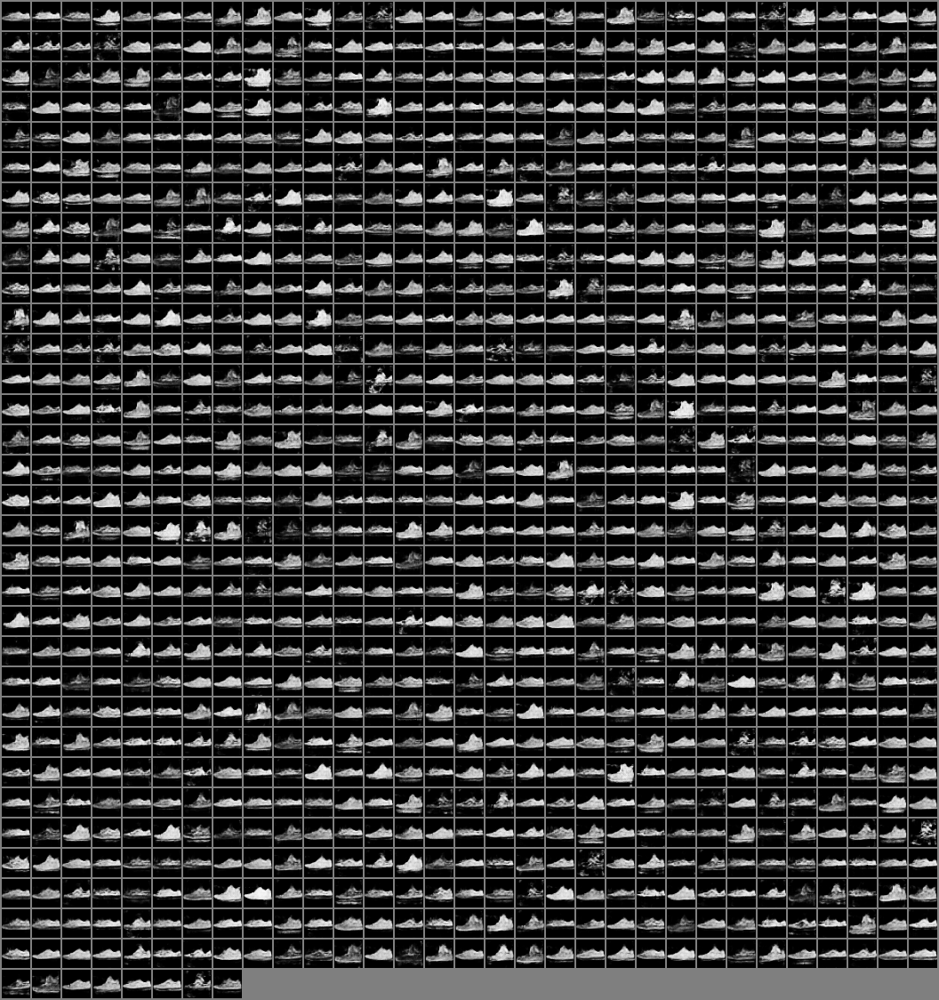

Number chosen:  8


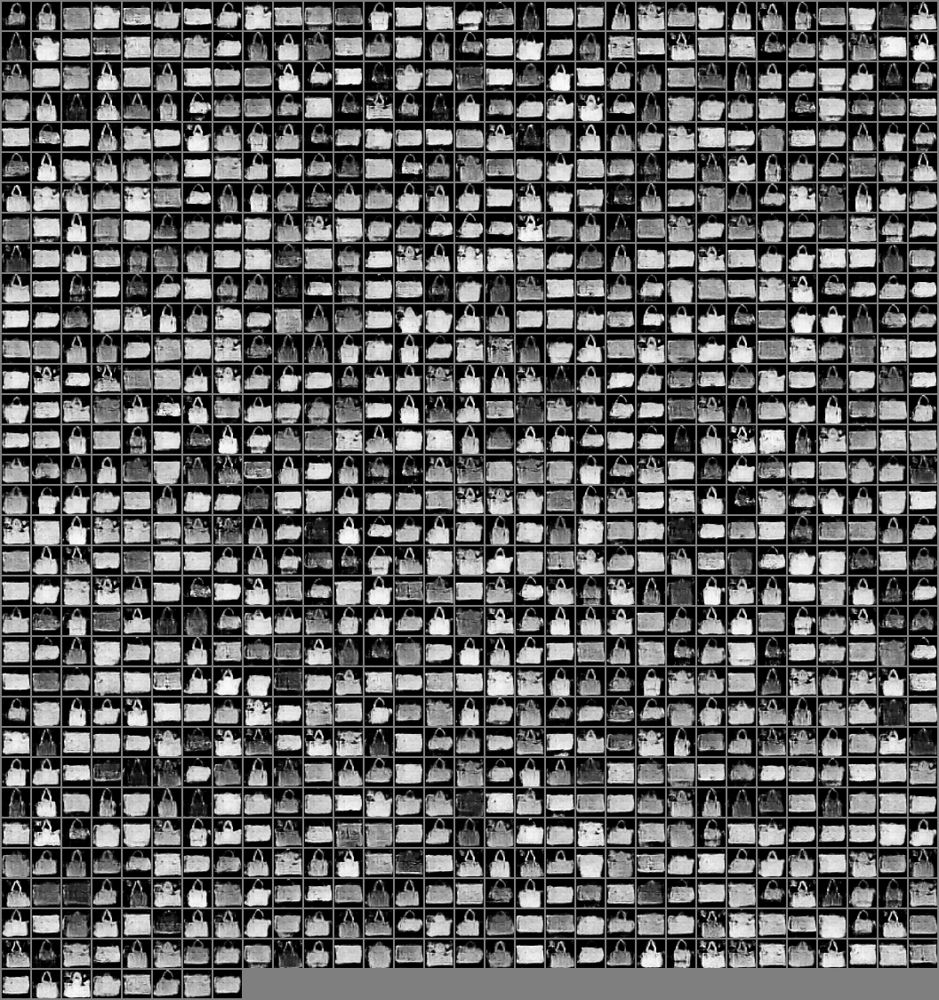

Number chosen:  9


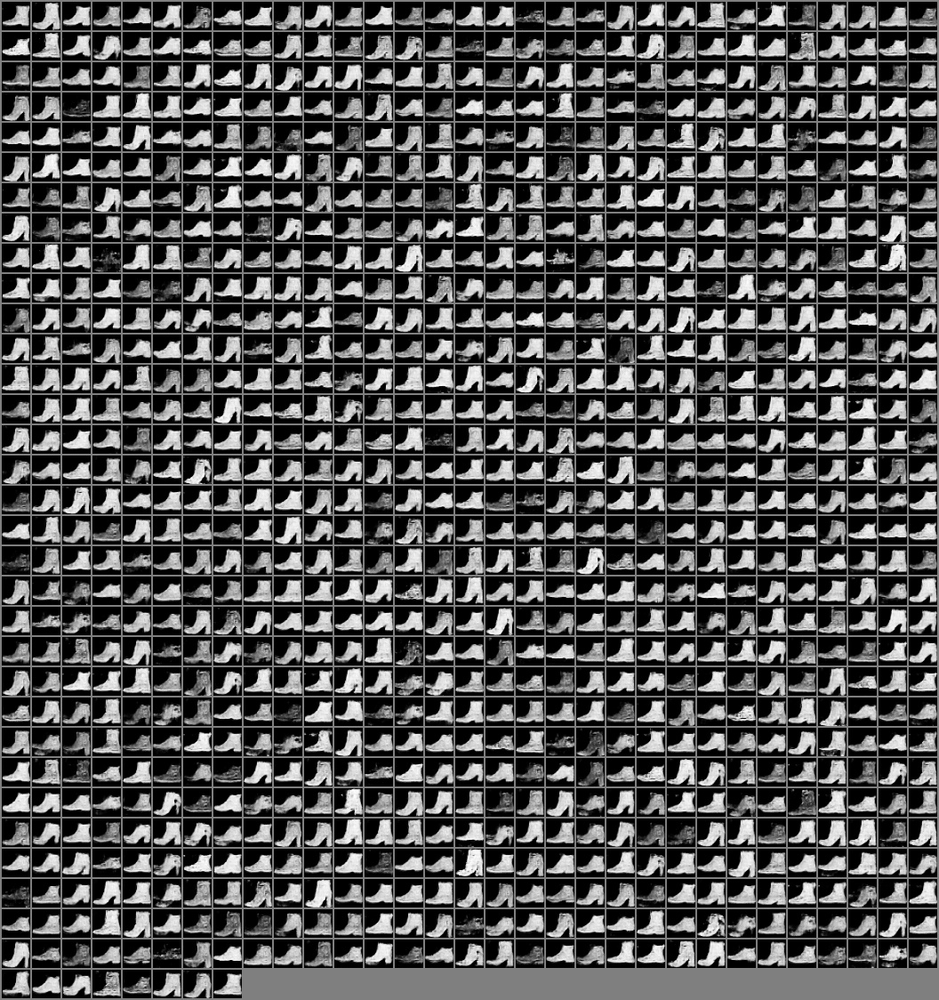

In [85]:
#You can play and visualize different numbers
for number_chosen in range(10):
    print("Number chosen: ", number_chosen)
    z_val = torch.randn(hparams2['num_save_samples'], hparams2['noise_size'], device=device)
    number_chosen_torch = torch.tensor([number_chosen for i in range(hparams2['num_save_samples'])
      ], 
      device=device).unsqueeze(1)
    images_number_chosen = evaluate_store_conditional(generator, z_val, number_chosen_torch, number_chosen)
    display(images_number_chosen)

## Create dataset
We create a dataset from the images we saved

In [86]:
class GeneratedDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.transform = ToTensor()

        self.class_labels = sorted(os.listdir(root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.class_labels)}
        self.images = []

        for cls in self.class_labels:
            class_dir = os.path.join(root_dir, cls)
            for filename in os.listdir(class_dir):
                image_path = os.path.join(class_dir, filename)
                self.images.append((image_path, self.class_to_idx[cls]))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path, label = self.images[idx]
        image = self.transform(Image.open(image_path).convert('L'))
        return image, label

We concat the training dataset we had for Fashionmnist to improve training capabilities. We don't touch the validation, as if we include the generated images the results may be distorsioned.

In [87]:
concat_traindataset = ConcatDataset([mnist_trainset, GeneratedDataset(os.getcwd()+"\\gen_data")])

In [88]:
# Dataloders initialization

train_loader = torch.utils.data.DataLoader(
    dataset=concat_traindataset,
    batch_size=hparams1['batch_size'], 
    shuffle=True,
    drop_last=True,
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


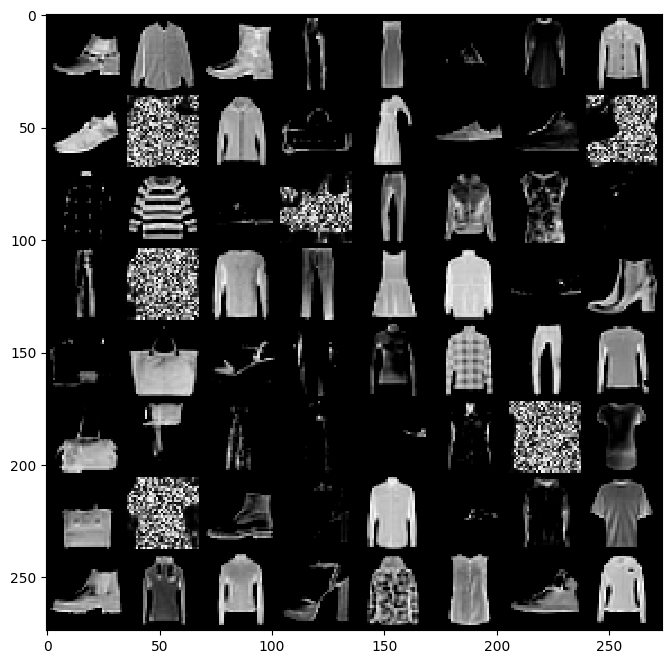

In [89]:
iter_ = iter(train_loader)
bimg, blabel = next(iter_)
img_grid = make_grid(bimg) 
plt.figure(figsize = (8, 8))
plt.imshow(img_grid.permute(1, 2, 0), interpolation='nearest')

In [97]:
# Init lists to save the evolution of the training & test losses/accuracy.
train_losses = []
test_losses = []
train_accs = []
test_accs = []

# For each epoch
for epoch in range(hparams1['num_epochs']):

    # Compute & save the average training loss for the current epoch
    train_loss, train_acc = train_epoch(train_loader, network, optimizer, criterion, hparams1["log_interval"])
    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # TODO: Compute & save the average test loss & accuracy for the current epoch
    # HELP: Review the functions previously defined to implement the train/test epochs
    test_loss, test_accuracy = test_epoch(test_loader, network)

    test_losses.append(test_loss)
    test_accs.append(test_accuracy)

Train Epoch: 0 [0/70000 (0%)]	Loss: 0.458797
Train Epoch: 0 [6400/70000 (9%)]	Loss: 0.457909
Train Epoch: 0 [12800/70000 (18%)]	Loss: 0.436409
Train Epoch: 0 [19200/70000 (27%)]	Loss: 0.678784
Train Epoch: 0 [25600/70000 (37%)]	Loss: 0.479862
Train Epoch: 0 [32000/70000 (46%)]	Loss: 0.569118
Train Epoch: 0 [38400/70000 (55%)]	Loss: 0.363036
Train Epoch: 0 [44800/70000 (64%)]	Loss: 0.534230
Train Epoch: 0 [51200/70000 (73%)]	Loss: 0.576014
Train Epoch: 0 [57600/70000 (82%)]	Loss: 0.451038
Train Epoch: 0 [64000/70000 (91%)]	Loss: 0.538755

Test set: Average loss: 0.4748, Accuracy: 8314/10000 (83%)

Train Epoch: 1 [0/70000 (0%)]	Loss: 0.462491
Train Epoch: 1 [6400/70000 (9%)]	Loss: 0.368260
Train Epoch: 1 [12800/70000 (18%)]	Loss: 0.454840
Train Epoch: 1 [19200/70000 (27%)]	Loss: 0.424427
Train Epoch: 1 [25600/70000 (37%)]	Loss: 0.600533
Train Epoch: 1 [32000/70000 (46%)]	Loss: 0.478584
Train Epoch: 1 [38400/70000 (55%)]	Loss: 0.674100
Train Epoch: 1 [44800/70000 (64%)]	Loss: 0.456682
Tra

Note that we don't use the generated images as a validation, only the original ones. At start we see that we instantly position around 85% (the max value we arrived after all epochs), and finally arriving around 87-90% of accuracy.

#### References

[1] https://github.com/pytorch/examples/blob/master/mnist/main.py